# NBA Assignment

Notes:
- Hyper parameter search was based on optimizing the ROC AUC score as indicated in the instructions
- Since the dataset is imbalanced, looking at the ROC AUC gaps between the train and test datasets would be more reasonable as compared to accuracy gaps


In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

import mlflow
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_predict, StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, confusion_matrix
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.manifold import TSNE
from sklearn.base import BaseEstimator, TransformerMixin

## 0. Define Functions
NOTE: the variable used inside the functions are X_test and y_test. In fact, these should be X_eval, and y_eval. These should be in a separate code.

In [3]:
def rf_training_eval_pipeline(X, y, params, test_size=0.2, random_state=42):
    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, 
        test_size=test_size, 
        random_state=random_state, 
        stratify=y)

    # Train the model
    rf_model = RandomForestClassifier(**params, n_jobs=-1, random_state=random_state)
    rf_model.fit(X_train, y_train)

    # Predict
    y_train_pred = rf_model.predict(X_train)
    y_test_pred = rf_model.predict(X_test)
    y_train_pred_prob = rf_model.predict_proba(X_train)[:,1]
    y_test_pred_prob = rf_model.predict_proba(X_test)[:,1]
    
    # Compute eval metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    
    train_precision = precision_score(y_train, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)  
    
    train_recall = recall_score(y_train, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred) 
    
    train_f1 = f1_score(y_train, y_train_pred) 
    test_f1 = f1_score(y_test, y_test_pred)
    
    train_roc_auc = roc_auc_score(y_train, y_train_pred_prob) 
    test_roc_auc = roc_auc_score(y_test, y_test_pred_prob)

    
    # Create a DataFrame to store the results
    results_df = pd.DataFrame({
        'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC AUC'],
        'Train': [train_accuracy, train_precision, train_recall, train_f1, train_roc_auc],
        'Test': [test_accuracy, test_precision, test_recall, test_f1, test_roc_auc]
    })
    print(results_df) 
    
    # SHow CM for training set
    cm = confusion_matrix(y_train, y_train_pred)
    plt.figure(figsize=(4, 3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix (Train Set)')
    plt.show()
    
    # Print the confusion matrix for the test set
    cm = confusion_matrix(y_test, y_test_pred)
    plt.figure(figsize=(4, 3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix (Test Set)')
    plt.show()
    
    return rf_model, results_df

In [4]:
def rf_param_search(X, y, param_grid, cv=5, random_state=42, scoring='roc_auc', n_jobs=-1):
    '''Performs grid search to a data set and returns the randomized_search.'''
    # ------- RANDOM SEARCH -------
    # Instantiate RF Clf
    rf_classifier = RandomForestClassifier(
        random_state=random_state,
        warm_start=True,
        n_jobs=n_jobs,
    )

    # Set random search
    randomized_search = RandomizedSearchCV(
        estimator=rf_classifier, 
        param_distributions=param_grid,
        n_iter=100,
        cv=cv,
        scoring=scoring,
        n_jobs=n_jobs,
        verbose=0,
    )

    # Perform Random Search
    randomized_search.fit(X, y)

    # Store results to results_df
    results_df = pd.DataFrame(randomized_search.cv_results_)
    results_df.sort_values(by='mean_test_score', ascending=False, inplace=True)
    results_df = results_df[[
        'params', 'rank_test_score',
        # 'mean_train_score', 'std_train_score', 
        'mean_test_score', 'std_test_score',]
    ]

    # Show search results
    print('SEARCH TOP RESULTS:')
    print(results_df.head())

    # ------- EVALUATING BEST MODEL -------
    best_rf_model = randomized_search.best_estimator_
    
    best_params = randomized_search.best_params_
    print(f"Best Parameters: {best_params}")

    return best_rf_model,  best_params, results_df

In [5]:
def evaluate_model_cv(X, y, model, cv=5, n_jobs=-1):
    accuracy = cross_val_score(model, X, y, cv=cv, scoring='accuracy', n_jobs=n_jobs)
    roc_auc_scores = cross_val_score(model, X, y, cv=cv, scoring='roc_auc', n_jobs=n_jobs)
    precision_scores = cross_val_score(model, X, y, cv=cv, scoring='precision', n_jobs=n_jobs)
    recall_scores = cross_val_score(model, X, y, cv=cv, scoring='recall', n_jobs=n_jobs)
    f1_scores = cross_val_score(model, X, y, cv=cv, scoring='f1', n_jobs=n_jobs)

    results_df = pd.DataFrame({
        'Metric': ['Accuracy', 'ROC AUC', 'Precision', 'Recall', 'F1-score'],
        'Validation Mean': [accuracy.mean(), roc_auc_scores.mean(), precision_scores.mean(), recall_scores.mean(), f1_scores.mean()],
        'Validation Std Dev': [accuracy.std(), roc_auc_scores.std(), precision_scores.std(), recall_scores.std(), f1_scores.std()],
        })

    return results_df

In [6]:
def plot_correlation_mat(df, figsize=(12,12), title=None):
    correlation_matrix = df.corr()
    plt.figure(figsize=figsize)
    sns.heatmap(correlation_matrix, annot=True, cmap='viridis', fmt=".2f")
    
    if title:
        plt.title(title)
        
    plt.show()

In [7]:
def tsne_model_explore(X, y, n_components, n_estimators=1000, random_state=42):
    '''Model based on TSNE. For exploration only.
    Note: wrapped in a fuction so that all of the manipulations will only occur inside the function
    '''
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=random_state)
    
    # Features
    features = [
        ('tsne', TSNEEmbeddingTransformer(n_components=n_components)), 
    ]
    feature_union = FeatureUnion(features)
    
    # Classifier
    rf_clf = RandomForestClassifier(n_estimators=300, random_state=random_state)
    
    # Pipeline
    pipeline = Pipeline([
        ('features', feature_union),
        ('rf', rf_classifier),
    ])
    
    # Train
    pipeline.fit(X_train, y_train)

    # ----  Evaluate train ----
    y_train_pred = pipeline.predict(X_train)
    accuracy = pipeline.score(X_train, y_train)
    training_accuracy = accuracy_score(y_train, y_train_pred)
    
    y_train_prob = pipeline.predict_proba(X_train)[:, 1]
    # fpr, tpr, thresholds = roc_curve(y_train, y_train_prob)
    roc_auc = roc_auc_score(y_train, y_train_prob)
    
    print(f"""
    TRAIN:
    ACC: {accuracy:.4f}
    ROC AUC Score: {roc_auc:.4f}
    {training_accuracy}
    """)
    
    # ---- Evaluate test --- # Note: Should have made this as a func
    accuracy = pipeline.score(X_test, y_test)
    y_test_prob = pipeline.predict_proba(X_test)[:, 1]
    # fpr, tpr, thresholds = roc_curve(y_test, y_test_prob)   
    roc_auc = roc_auc_score(y_test, y_test_prob)
    
    print(f"""
    TEST:
    ACC: {accuracy:.4f}
    ROC AUC Score: {roc_auc:.4f}
    """)

    return pipeline

## 1. Load Data

In [8]:
# Define user parameters
RAW_DATA_PATH = os.path.join(os.pardir, 'data', 'raw')
TRAIN_DATA_FILENAME = 'nba_train.csv'
TEST_DATA_FILENAME = 'nba_test.csv'
response = 'TARGET_5Yrs'

random_state = 42

In [9]:
# Load the train and test data sets
train_data_path = os.path.join(RAW_DATA_PATH, TRAIN_DATA_FILENAME)
test_data_path = os.path.join(RAW_DATA_PATH, TEST_DATA_FILENAME)

train_df = pd.read_csv(train_data_path)
test_df = pd.read_csv(test_data_path)

train_df.drop('Id', inplace=True, axis=1)
# test_df.drop('Id', inplace=True, axis=1)

X_train = train_df.drop(response, axis=1)
y_train = train_df[response]
X_test = test_df.copy()

original_features = list(X_train.columns)

In [10]:
original_features

['GP',
 'MIN',
 'PTS',
 'FGM',
 'FGA',
 'FG%',
 '3P Made',
 '3PA',
 '3P%',
 'FTM',
 'FTA',
 'FT%',
 'OREB',
 'DREB',
 'REB',
 'AST',
 'STL',
 'BLK',
 'TOV']

## 2. Check the performance in T-SNE Embeddings

Done for benchmarking only. During EDA, there are two clusters in the feature space. The objective of this is to check if there are a lot of instance overlaps in the feature space. 

In [11]:
# Custom TX for TSNE embedding
class TSNEEmbeddingTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, n_components=4, perplexity=50, learning_rate=500):
        self.n_components = n_components
        self.perplexity = perplexity
        self.learning_rate = learning_rate
        self.tsne = TSNE(n_components=n_components, perplexity=perplexity, learning_rate=learning_rate)

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return self.tsne.fit_transform(X)

In [12]:
# Model
n_components = 3
# tsne_model_explore(X_train, y_train, n_components)

## 3. Build Initial Random Forest Model 

Modeling algorithm considered for this is the RF algo -- less sensitive to multicollinearity. No specifications that we need a parsimonous model. 

### 3.1. Perform Hyper Param Search

In [13]:
param_grid = {
    'n_estimators': np.arange(100, 1001, 100),
    'max_depth': [None] + list(np.arange(10, 31, 5)),
    'min_samples_split': [2, 5, 10, 20], 
    'min_samples_leaf': [1, 2, 4, 8]
}

model, params, results_df =  rf_param_search(X_train, y_train, param_grid=param_grid)

SEARCH TOP RESULTS:
                                               params  rank_test_score  \
33  {'n_estimators': 500, 'min_samples_split': 5, ...                1   
73  {'n_estimators': 800, 'min_samples_split': 5, ...                2   
38  {'n_estimators': 300, 'min_samples_split': 10,...                3   
99  {'n_estimators': 200, 'min_samples_split': 5, ...                4   
17  {'n_estimators': 300, 'min_samples_split': 10,...                5   

    mean_test_score  std_test_score  
33         0.695506        0.006279  
73         0.694335        0.005135  
38         0.694257        0.005520  
99         0.694082        0.006230  
17         0.693982        0.005234  
Best Parameters: {'n_estimators': 500, 'min_samples_split': 5, 'min_samples_leaf': 8, 'max_depth': 10}


In [14]:
results_df.head()

,params,rank_test_score,mean_test_score,std_test_score
33,"{'n_estimators': 500, 'min_samples_split': 5, ...",1,0.695506,0.006279
73,"{'n_estimators': 800, 'min_samples_split': 5, ...",2,0.694335,0.005135
38,"{'n_estimators': 300, 'min_samples_split': 10,...",3,0.694257,0.005520
99,"{'n_estimators': 200, 'min_samples_split': 5, ...",4,0.694082,0.006230
17,"{'n_estimators': 300, 'min_samples_split': 10,...",5,0.693982,0.005234


In [21]:
# Show model
model

RandomForestClassifier(max_depth=10, min_samples_leaf=8, min_samples_split=5,
                       n_estimators=500, n_jobs=-1, random_state=42,
                       warm_start=True)

### 3.2. Evaluate Model From Hyper Param Search

In [15]:
# Evaluate through CV
eval_results = evaluate_model_cv(X_train, y_train, model)
eval_results

,Metric,Validation Mean,Validation Std Dev
0,Accuracy,0.834750,0.001159
1,ROC AUC,0.695506,0.006279
2,Precision,0.836588,0.001134
3,Recall,0.996401,0.001290
4,F1-score,0.909526,0.000614


### 3.3. Retrain and Check Model Fit Using Params from Hyper Param Search

      Metric     Train      Test
0   Accuracy  0.848594  0.830625
1  Precision  0.846728  0.835755
2     Recall  0.999250  0.991754
3   F1 Score  0.916688  0.907096
4    ROC AUC  0.913821  0.695475


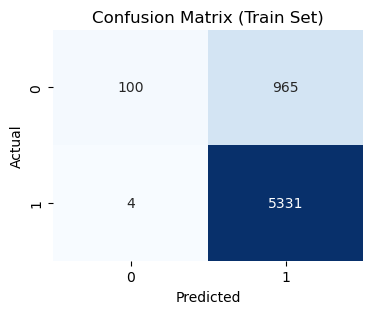

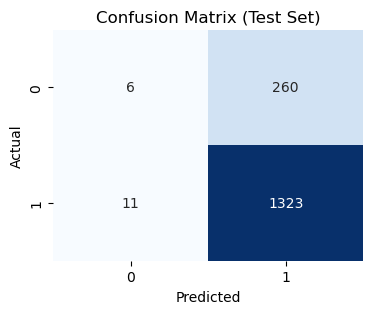

In [16]:
rf_model_orig_features, results_df_orig_features = rf_training_eval_pipeline(X_train[original_features], y_train, params)

## 3. Feature Engineering

There are NBA indices that can be derived from the raw data. 
* [Player Efficiency Rating (PER)](https://en.wikipedia.org/wiki/Player_efficiency_rating#:~:text=The%20player%20efficiency%20rating%20(PER,rates%20every%20player's%20statistical%20performance)
* Effective Field Goal Percentage


In [17]:
# Add Player Efficiency Rating
X_train['PER'] = (
    X_train['PTS'] + 
    X_train['REB'] + 
    X_train['AST'] + 
    X_train['STL'] + 
    X_train['BLK'] - 
    X_train['TOV']
)

# Add Effecive Field Goal Percentage
X_train['EFG'] = ((X_train['FGM'] + 0.5 * X_train['3P Made']) / X_train['FGA'])

### 3.1 Explore new feature(s)

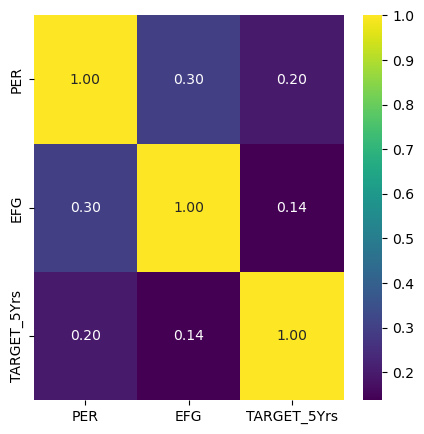

In [18]:
plot_correlation_mat(pd.concat([X_train[['PER', 'EFG']], y_train], axis=1), (5,5))

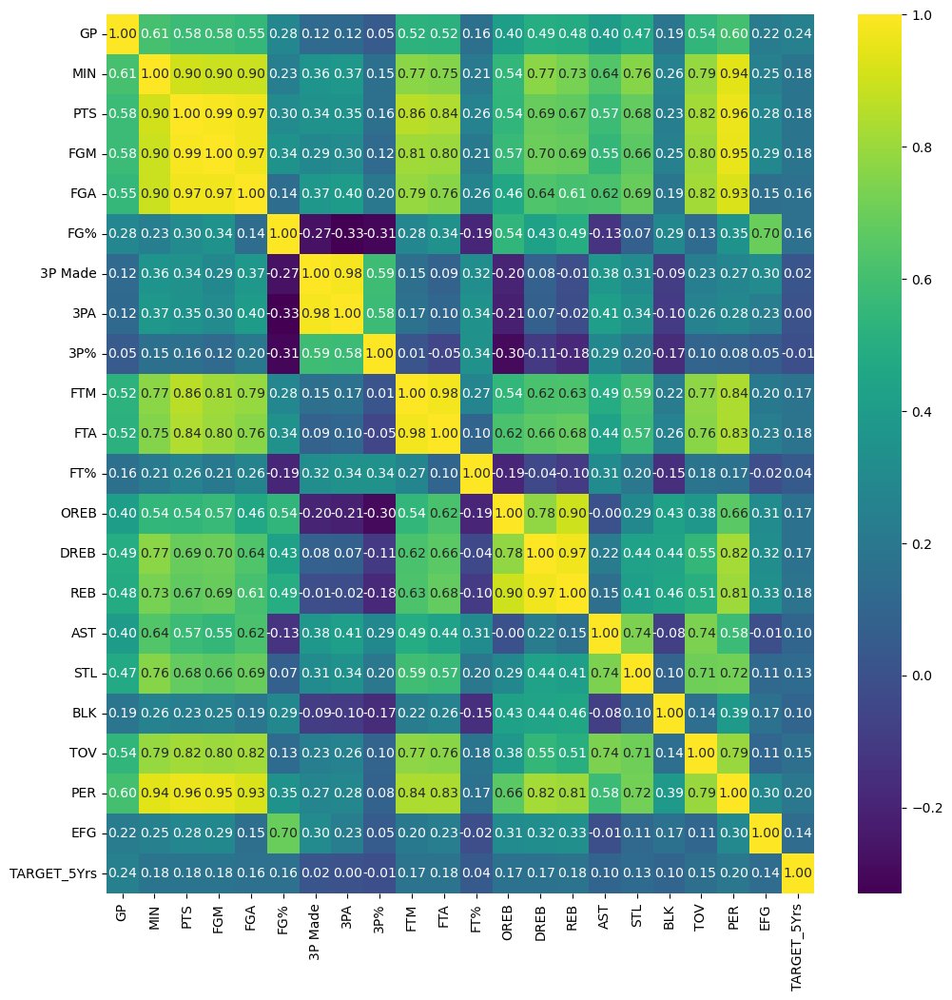

In [19]:
plot_correlation_mat(pd.concat([X_train, y_train], axis=1))
# TRY TO REMOVE
# FS1 REMOVE: FGM, FGA, 3PA, FTA, REB
# FS2 REMOVE: MIN, PTS, FGM, FGA, FTA, REB, 3PA

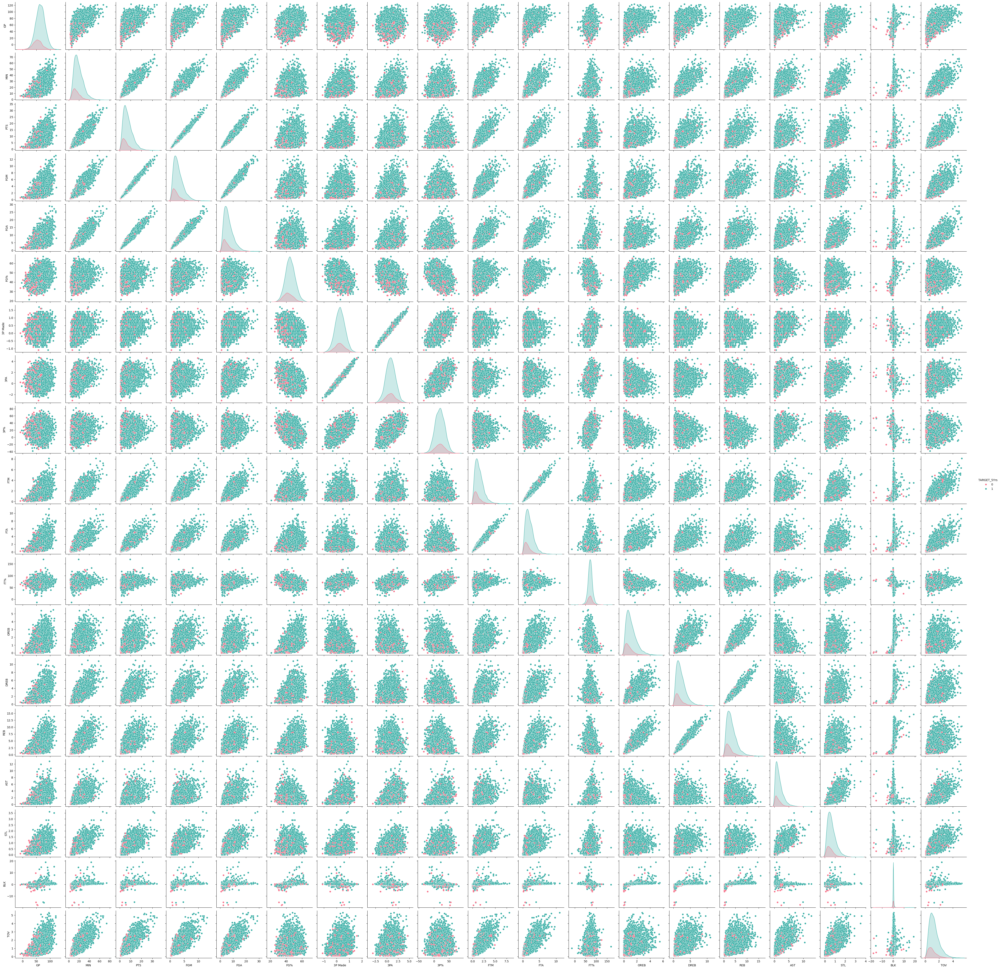

In [20]:
sns.pairplot(train_df, hue=response, palette='husl')
plt.show()

## 3.2 Feature Set +  PER index

SEARCH TOP RESULTS:
                                               params  rank_test_score  \
99  {'n_estimators': 700, 'min_samples_split': 10,...                1   
80  {'n_estimators': 500, 'min_samples_split': 2, ...                2   
83  {'n_estimators': 800, 'min_samples_split': 2, ...                3   
95  {'n_estimators': 200, 'min_samples_split': 2, ...                4   
94  {'n_estimators': 300, 'min_samples_split': 10,...                5   

    mean_test_score  std_test_score  
99         0.694985        0.006629  
80         0.694822        0.006748  
83         0.694654        0.006441  
95         0.694057        0.007210  
94         0.693964        0.007420  
Best Parameters: {'n_estimators': 700, 'min_samples_split': 10, 'min_samples_leaf': 8, 'max_depth': 10}
      Metric  Validation Mean  Validation Std Dev
0   Accuracy         0.834750            0.001346
1    ROC AUC         0.694985            0.006629
2  Precision         0.836505            0.001496
3  

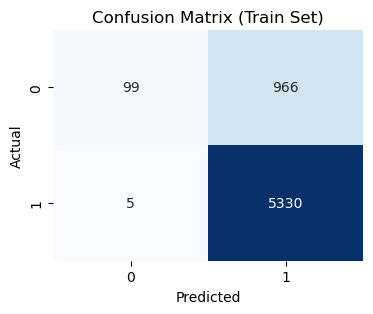

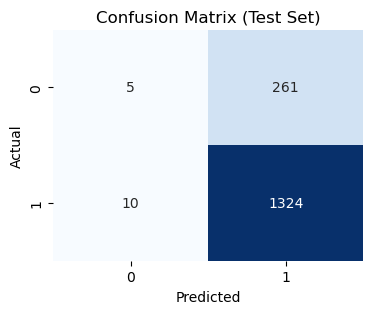

In [22]:
# Set features
feature_set = original_features + ['PER']

# Set param grid
param_grid = {
    'n_estimators': np.arange(100, 1001, 100),
    'max_depth': [None] + list(np.arange(10, 31, 5)),
    'min_samples_split': [2, 5, 10, 20], 
    'min_samples_leaf': [1, 2, 4, 8]
}

model, params, results_df = rf_param_search(X_train[feature_set], y_train, param_grid)

# Evaluate through CV
eval_results = evaluate_model_cv(X_train[feature_set], y_train, model)
print(eval_results)

rf_model_per, results_df_per = rf_training_eval_pipeline(X_train[feature_set], y_train, params)

### 3.3 Feature Set + PER and EFG indices

SEARCH TOP RESULTS:
                                               params  rank_test_score  \
33  {'n_estimators': 400, 'min_samples_split': 2, ...                1   
31  {'n_estimators': 900, 'min_samples_split': 10,...                2   
75  {'n_estimators': 1000, 'min_samples_split': 10...                3   
39  {'n_estimators': 100, 'min_samples_split': 5, ...                4   
25  {'n_estimators': 1000, 'min_samples_split': 20...                5   

    mean_test_score  std_test_score  
33         0.695311        0.005122  
31         0.695221        0.006014  
75         0.695146        0.006225  
39         0.693940        0.005698  
25         0.693506        0.006306  
Best Parameters: {'n_estimators': 400, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_depth': 10}
      Metric  Validation Mean  Validation Std Dev
0   Accuracy         0.834875            0.002284
1    ROC AUC         0.695311            0.005122
2  Precision         0.837202            0.001288
3   

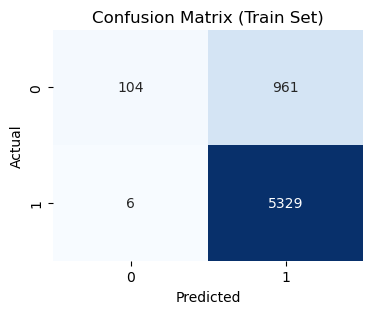

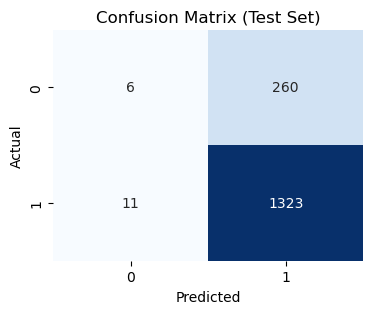

In [23]:
# Set features
feature_set = original_features + ['PER', 'EFG']

# Set param grid
param_grid = {
    'n_estimators': np.arange(100, 1001, 100),
    'max_depth': [None] + list(np.arange(10, 31, 5)),
    'min_samples_split': [2, 5, 10, 20], 
    'min_samples_leaf': [1, 2, 4, 8]
}

model, params, results_df = rf_param_search(X_train[feature_set], y_train, param_grid)

params_final = params.copy()

# Evaluate through CV
eval_results = evaluate_model_cv(X_train[feature_set], y_train, model)
print(eval_results)

rf_model_perefg, results_df_perefg = rf_training_eval_pipeline(X_train[feature_set], y_train, params)

In [24]:
X_train

,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,FTM,...,FT%,OREB,DREB,REB,AST,STL,BLK,TOV,PER,EFG
0,80,24.3,7.8,3.0,6.4,45.7,0.1,0.3,22.6,2.0,...,72.1,2.2,2.0,3.8,3.2,1.1,0.2,1.6,14.5,0.476562
1,75,21.8,10.5,4.2,7.9,55.1,-0.3,-1.0,34.9,2.4,...,67.8,3.6,3.7,6.6,0.7,0.5,0.6,1.4,17.5,0.512658
2,85,19.1,4.5,1.9,4.5,42.8,0.4,1.2,34.3,0.4,...,75.7,0.6,1.8,2.4,0.8,0.4,0.2,0.6,7.7,0.466667
3,63,19.1,8.2,3.5,6.7,52.5,0.3,0.8,23.7,0.9,...,66.9,0.8,2.0,3.0,1.8,0.4,0.1,1.9,11.6,0.544776
4,63,17.8,3.7,1.7,3.4,50.8,0.5,1.4,13.7,0.2,...,54.0,2.4,2.7,4.9,0.4,0.4,0.6,0.7,9.3,0.573529
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,32,9.2,1.8,0.7,1.8,40.3,-0.1,-0.2,23.1,0.4,...,65.7,0.3,1.8,1.9,0.5,0.3,0.2,0.4,4.3,0.361111
7996,54,6.0,1.8,0.7,1.4,48.7,0.1,0.1,3.1,0.2,...,70.1,1.0,1.1,2.0,0.1,0.0,0.3,0.3,3.9,0.535714
7997,85,28.2,10.7,4.0,9.0,45.1,0.2,0.6,23.6,2.8,...,69.7,1.0,2.1,3.1,3.4,1.2,0.2,1.8,16.8,0.455556
7998,39,7.7,2.5,1.0,2.3,40.1,-0.3,-0.5,13.3,0.6,...,74.3,0.4,0.6,0.9,0.2,0.3,0.3,0.5,3.7,0.369565


### 3.4 Remove collinear features w/o new indices

In [25]:
remove_list = ['FGM', 'FGA', '3PA', 'FTA', 'REB']

# Set features
feature_set = [feature for feature in original_features if feature not in remove_list]

print(feature_set)

['GP', 'MIN', 'PTS', 'FG%', '3P Made', '3P%', 'FTM', 'FT%', 'OREB', 'DREB', 'AST', 'STL', 'BLK', 'TOV']


SEARCH TOP RESULTS:
                                               params  rank_test_score  \
72  {'n_estimators': 900, 'min_samples_split': 20,...                1   
75  {'n_estimators': 1000, 'min_samples_split': 10...                2   
89  {'n_estimators': 900, 'min_samples_split': 5, ...                3   
95  {'n_estimators': 700, 'min_samples_split': 10,...                4   
14  {'n_estimators': 800, 'min_samples_split': 2, ...                5   

    mean_test_score  std_test_score  
72         0.697265        0.006066  
75         0.695683        0.006152  
89         0.695516        0.005986  
95         0.695395        0.006020  
14         0.695362        0.006028  
Best Parameters: {'n_estimators': 900, 'min_samples_split': 20, 'min_samples_leaf': 8, 'max_depth': 10}
      Metric  Validation Mean  Validation Std Dev
0   Accuracy         0.834375            0.001118
1    ROC AUC         0.697265            0.006066
2  Precision         0.836102            0.000821
3  

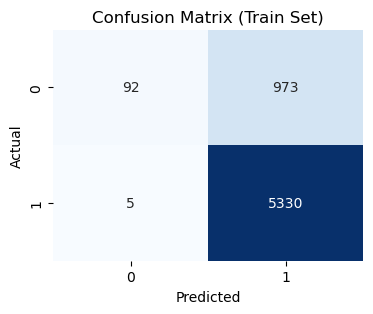

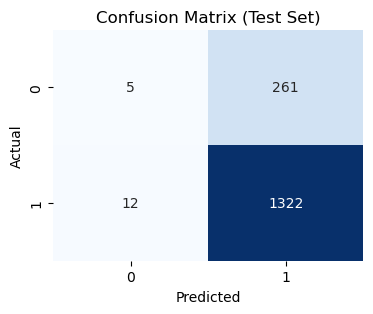

In [26]:
# Set param grid
param_grid = {
    'n_estimators': np.arange(100, 1001, 100),
    'max_depth': [None] + list(np.arange(10, 31, 5)),
    'min_samples_split': [2, 5, 10, 20], 
    'min_samples_leaf': [1, 2, 4, 8]
}

model, params, results_df = rf_param_search(X_train[feature_set], y_train, param_grid)

# Evaluate through CV
eval_results = evaluate_model_cv(X_train[feature_set], y_train, model)
print(eval_results)

rf_model_rem1, results_df_rem1 = rf_training_eval_pipeline(X_train[feature_set], y_train, params)

### 3.5 Remove collinear features, include 'PER'

In [27]:
remove_list =  ['MIN', 'PTS', 'FGM', 'FGA', 'FTA', 'REB', '3PA']

# Set features
feature_set = [feature for feature in original_features if feature not in remove_list] + ['PER']

print(feature_set)
print(len(feature_set))

['GP', 'FG%', '3P Made', '3P%', 'FTM', 'FT%', 'OREB', 'DREB', 'AST', 'STL', 'BLK', 'TOV', 'PER']
13


SEARCH TOP RESULTS:
                                               params  rank_test_score  \
64  {'n_estimators': 300, 'min_samples_split': 5, ...                1   
90  {'n_estimators': 1000, 'min_samples_split': 20...                2   
30  {'n_estimators': 600, 'min_samples_split': 2, ...                3   
19  {'n_estimators': 600, 'min_samples_split': 10,...                3   
40  {'n_estimators': 700, 'min_samples_split': 10,...                5   

    mean_test_score  std_test_score  
64         0.697538        0.007120  
90         0.697531        0.006267  
30         0.697436        0.007198  
19         0.697436        0.007198  
40         0.697399        0.007283  
Best Parameters: {'n_estimators': 300, 'min_samples_split': 5, 'min_samples_leaf': 8, 'max_depth': 10}
      Metric  Validation Mean  Validation Std Dev
0   Accuracy         0.834250            0.001335
1    ROC AUC         0.697538            0.007120
2  Precision         0.836675            0.001060
3   

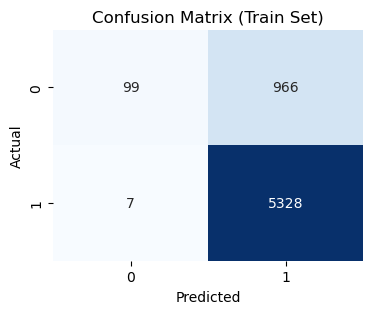

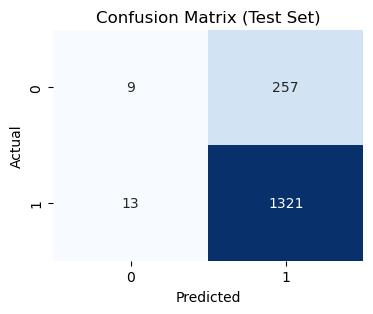

In [28]:
# Set param grid
param_grid = {
    'n_estimators': np.arange(100, 1001, 100),
    'max_depth': [None] + list(np.arange(10, 31, 5)),
    'min_samples_split': [2, 5, 10, 20], 
    'min_samples_leaf': [1, 2, 4, 8]
}

model, params, results_df = rf_param_search(X_train[feature_set], y_train, param_grid)

# Evaluate through CV
eval_results = evaluate_model_cv(X_train[feature_set], y_train, model)
print(eval_results)

rf_model_rem2, results_df_rem2 = rf_training_eval_pipeline(X_train[feature_set], y_train, params)

### 3.6. Printing all the results

In [29]:
# Original Features
results_df_orig_features

,Metric,Train,Test
0,Accuracy,0.848594,0.830625
1,Precision,0.846728,0.835755
2,Recall,0.999250,0.991754
3,F1 Score,0.916688,0.907096
4,ROC AUC,0.913821,0.695475


In [30]:
# Original Features + PER + EFG
results_df_perefg

,Metric,Train,Test
0,Accuracy,0.848906,0.830625
1,Precision,0.847218,0.835755
2,Recall,0.998875,0.991754
3,F1 Score,0.916817,0.907096
4,ROC AUC,0.912825,0.696991


In [31]:
# Removal of Collinear Features
results_df_rem1

,Metric,Train,Test
0,Accuracy,0.847187,0.829375
1,Precision,0.845629,0.835123
2,Recall,0.999063,0.991004
3,F1 Score,0.915965,0.906411
4,ROC AUC,0.897610,0.702847


In [32]:
# Removal of Collinear Features + PER
results_df_rem2

,Metric,Train,Test
0,Accuracy,0.847969,0.831250
1,Precision,0.846520,0.837136
2,Recall,0.998688,0.990255
3,F1 Score,0.916330,0.907280
4,ROC AUC,0.903008,0.704622


Insights:
- removing collinear reduced the gap between the train and test ROC AUC
- Still, the model is still overfitted but removal of collinear features and including PER yields better metrics

## 4. Modeling 

Train the model based using the feature engineered feature set (with removal of collinear features)

### 4.1 Features

In [33]:
remove_list =  ['MIN', 'PTS', 'FGM', 'FGA', 'FTA', 'REB', '3PA']

# Set features
feature_set = [feature for feature in original_features if feature not in remove_list] + ['PER']
print(feature_set)

['GP', 'FG%', '3P Made', '3P%', 'FTM', 'FT%', 'OREB', 'DREB', 'AST', 'STL', 'BLK', 'TOV', 'PER']


In [35]:
# Check best params 
print(params_final)

{'n_estimators': 400, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_depth': 10}


### 4.2 Modeling

In [39]:
rf_model = RandomForestClassifier(
    n_estimators=400,
    min_samples_split=2,
    min_samples_leaf=8,
    max_depth=10,
    n_jobs=-1,
    random_state=random_state
)


rf_model.fit(X_train[feature_set], y_train)

RandomForestClassifier(max_depth=10, min_samples_leaf=8, n_estimators=400,
                       n_jobs=-1, random_state=42)

### 4.3 Sanity Check

In [46]:
y_train_pred_proba = rf_model.predict_proba(X_train[feature_set])[:,1]
y_train_pred = rf_model.predict(X_train[feature_set])

In [47]:
roc_auc_score(y_train, y_train_pred_proba)

0.8913349148233881

In [49]:
accuracy_score(y_train, y_train_pred)

0.845125

### 4.4 Inference on Test Set

In [51]:
test_df['PER'] = (
    test_df['PTS'] + 
    test_df['REB'] + 
    test_df['AST'] + 
    test_df['STL'] + 
    test_df['BLK'] - 
    test_df['TOV']
)

rf_model.predict_proba(test_df[feature_set])[:,1]

<Axes: ylabel='Frequency'>

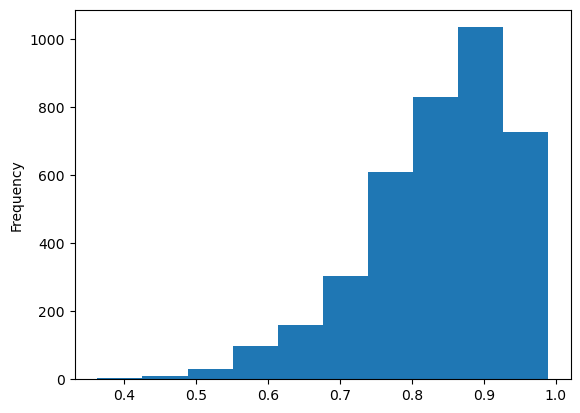

In [65]:
test_df['y_pred_proba'] = rf_model.predict_proba(test_df[feature_set])[:,1]
test_df['y_pred_proba'].plot(kind='hist')

In [62]:
# Save results 
test_df[response] = test_df['y_pred_proba']

In [64]:
test_df[['Id', response]].to_csv('StaCruz_NBA_submission.csv', sep=',', index=False)

# END

Anton Domini Sta. Cruz 2023